In [7]:
import os
import json
import argparse

import cv2
import glob
import wave
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch

from tqdm import tqdm
from natsort import natsorted
from typing import Optional, List, Tuple
from sklearn.model_selection import train_test_split

from scipy import signal
from scipy.io import wavfile
from scipy.ndimage import sobel

import librosa
import librosa.display

In [12]:
def get_log_spectrogram(audio, sample_rate, window_size=20,
                    step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))

    freqs, _, spec = signal.spectrogram(
        audio,
        fs=sample_rate,
        window='hann',
        nperseg=nperseg,
        noverlap=noverlap,
        detrend=False
    )

    return freqs, spec.T.astype(np.float32) + eps, np.log(spec.T.astype(np.float32) + eps)


def audio2spectrogram(filepath: str) -> np.ndarray:
    samplerate, test_sound = wavfile.read(filepath, mmap=True)

    _, spectrogram, log_spectrogram = get_log_spectrogram(test_sound, samplerate)

    return spectrogram, log_spectrogram


def audio2wave(filepath) -> np.ndarray:
    _, test_sound = wavfile.read(filepath, mmap=True)

    return test_sound

In [41]:
def gradients_channels(grayscale_array: np.ndarray) -> np.ndarray:
    gradient_x = sobel(grayscale_array, axis=0)
    gradient_y = sobel(grayscale_array, axis=1)

    visualize_spectrogram(gradient_x, '', 'Gradient x (horizontal direction)')
    visualize_spectrogram(gradient_y, '', 'Gradient y (vertica; direction)')

    return np.stack([grayscale_array, gradient_x, gradient_y], axis=-1)


def get_3d_spectrogram(Sxx_in, moments=None):
    if moments is not None:
        (base_mean, base_std, delta_mean, delta_std,
             delta2_mean, delta2_std) = moments
    else:
        base_mean, delta_mean, delta2_mean = (0, 0, 0)
        base_std, delta_std, delta2_std = (1, 1, 1)

    h, w = Sxx_in.shape

    right1 = np.concatenate([Sxx_in[:, 0].reshape((h, -1)), Sxx_in], axis=1)[:, :-1]
    delta = (Sxx_in - right1)[:, 1:]
    delta_pad = delta[:, 0].reshape((h, -1))
    delta = np.concatenate([delta_pad, delta], axis=1)

    right2 = np.concatenate([delta[:, 0].reshape((h, -1)), delta], axis=1)[:, :-1]
    delta2 = (delta - right2)[:, 1:]
    delta2_pad = delta2[:, 0].reshape((h, -1))
    delta2 = np.concatenate([delta2_pad, delta2], axis=1)

    base = (Sxx_in - base_mean) / base_std
    delta = (delta - delta_mean) / delta_std
    delta2 = (delta2 - delta2_mean) / delta2_std

    visualize_spectrogram(delta, '', 'Delta[f, t]')
    visualize_spectrogram(delta2, '', 'Delta2[f, t]')

    stacked = [arr.reshape((h, w, 1)) for arr in (base, delta, delta2)]

    return np.concatenate(stacked, axis=2)


def select_major_emotion(emotion_vector: np.array) -> np.array:
    """
    Returns the major emotion based on significance while retaining the original order.

    :param emotion_vector: List of binary values representing emotions.
    :return: A new binary vector with only the major emotion set to 1.
    """

    # Original order of emotions
    original_order = ["Curiosity", "Uncertainty", "Excitement", "Happiness",
                     "Surprise", "Disgust", "Fear", "Frustration"]

    # New order of significance
    new_order = ["Happiness", "Excitement", "Disgust", "Fear", "Frustration",
                 "Surprise", "Curiosity", "Uncertainty"]

    # Extract emotions from initial vector
    indicated_emotions = [original_order[i] for i, e in enumerate(emotion_vector) if e == 1]

    # Determine the most significant emotion from the new order
    for emotion in new_order:
        if emotion in indicated_emotions:
            major = emotion
            break

    # Create and return the new vector based on original order
    return np.array([1 if emotion == major else 0 for emotion in original_order])


def pad_image_top(img: np.ndarray, target_height: int = 224) -> np.ndarray:
    """
    Pad the image vertically from the top.

    Args:
        img: Input image (NumPy array).

    Returns:
        Padded image (NumPy array).
    """
    height_padding = target_height - img.shape[1]

    return np.pad(img, ((0, 0), (height_padding, 0), (0, 0)), mode='constant')


def pad_image_both(img: np.ndarray, target_height: int = 224) -> np.ndarray:
    """
    Pad the image vertically.

    Args:
        img: Input image (NumPy array).

    Returns:
        Padded image (NumPy array).
    """
    height_padding = target_height - img.shape[1]

    pad_top = height_padding // 2
    pad_bottom = height_padding - pad_top

    return np.pad(img, ((0, 0), (pad_top, pad_bottom), (0, 0)), mode='constant')


def sliding_window_overlap(image, window_size=224, overlap=168):
    """
    Extract patches from the image using a sliding window with overlap, ensuring even the last patch is of size 224.
    """

    patches = []

    stride = window_size - overlap
    for i in range(0, image.shape[0], stride):
        # If we're at the last window, and it's going to be smaller than 224
        if i + window_size > image.shape[0]:
            patches.append(image[-window_size:, :])
            break
        patches.append(image[i:i + window_size, :])

    return patches


def extract_central_parts(image, window_size=224, overlap=168):
    """
    Extract the central part(s) of the image.

    Args:
        image (np.ndarray): The input image.
        window_size (int): The size of the window to extract.
        overlap (int): Overlap size for extracting two windows. This is only used if two windows are extracted.

    Returns:
        list: A list containing one or two windows, depending on the image size.
    """
    # Compute the center of the image
    center = image.shape[0] // 2

    # Single central part
    start_single = center - (window_size // 2)
    end_single = start_single + window_size
    single_central_part = image[start_single:end_single, :]

    # Two overlapping central parts
    stride = window_size - overlap
    start_double1 = center - (window_size + stride // 2)
    end_double1 = start_double1 + window_size

    start_double2 = center - (stride // 2)
    end_double2 = start_double2 + window_size

    double_central_part1 = image[start_double1:end_double1, :]
    double_central_part2 = image[start_double2:end_double2, :]

    # Decide whether to return one or two parts based on the image size
    if center > window_size + stride // 2:
        return [double_central_part1, double_central_part2]
    else:
        return [single_central_part]

In [35]:
def visualize_spectrogram(spectrogram, emotion_name, spec_name):
    fig = plt.figure(figsize=(12, 6))
    plt.grid(False)
    plt.imshow(spectrogram.T[:, :], aspect='auto', origin='lower', cmap="viridis")

    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.title(f"{spec_name}")
    plt.show()

def visualize_emotion(spectrogram, emotion_name, spec_name):
    fig = plt.figure(figsize=(12, 6))

    plt.grid(False)
    plt.imshow(spectrogram.T[:, :, :], aspect='auto', origin='lower', cmap="viridis")

    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.title(f"{spec_name}")
    plt.show()

def visualize_wave(_wave, emotion_name, spec_name):
    fig = plt.figure(figsize=(10, 6))
    plt.grid(False)
    plt.plot(_wave)

    plt.ylabel("Hz")
    plt.title(f"{spec_name}")
    plt.show()

In [10]:
chan_gen_type = '3d_spectrogram'
overlap_size = 168
is_padding = True
padding_type = "both"


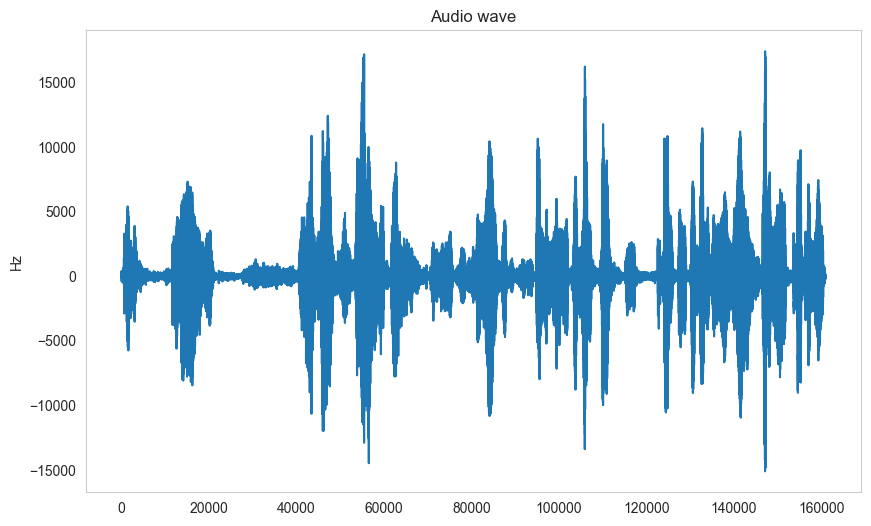

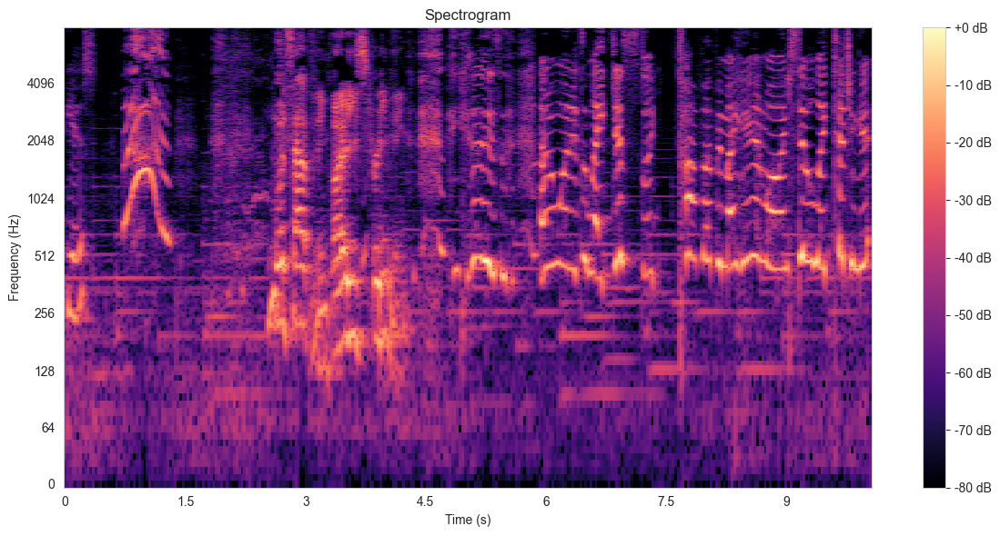

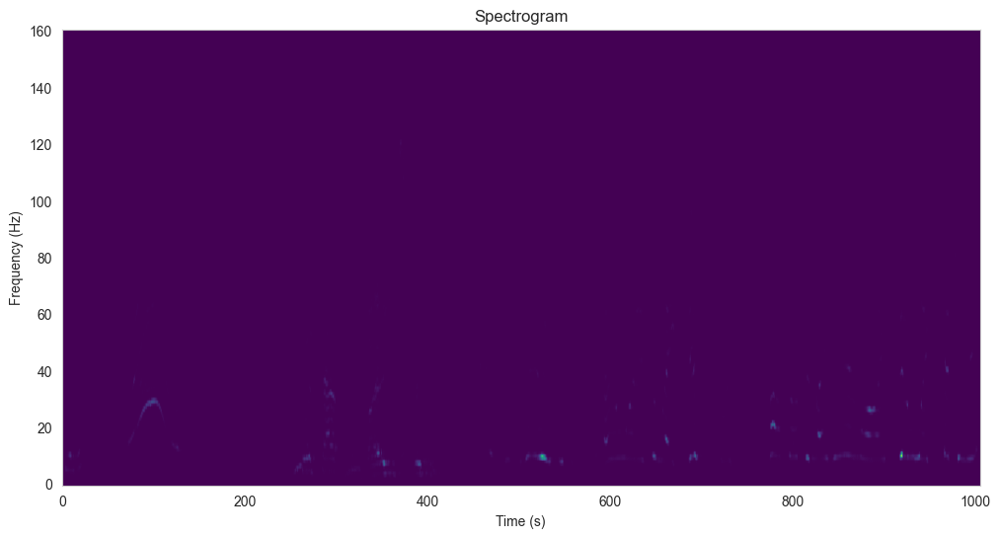

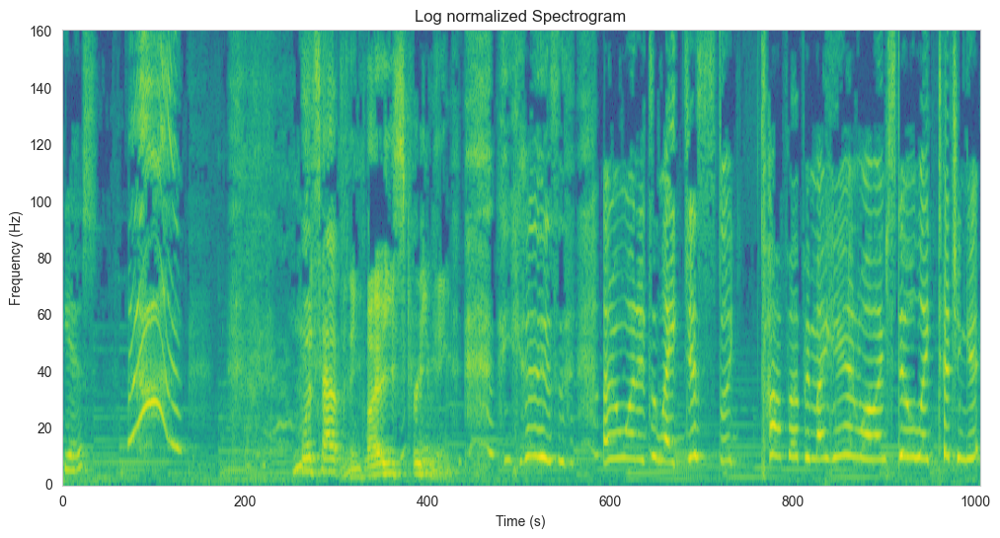

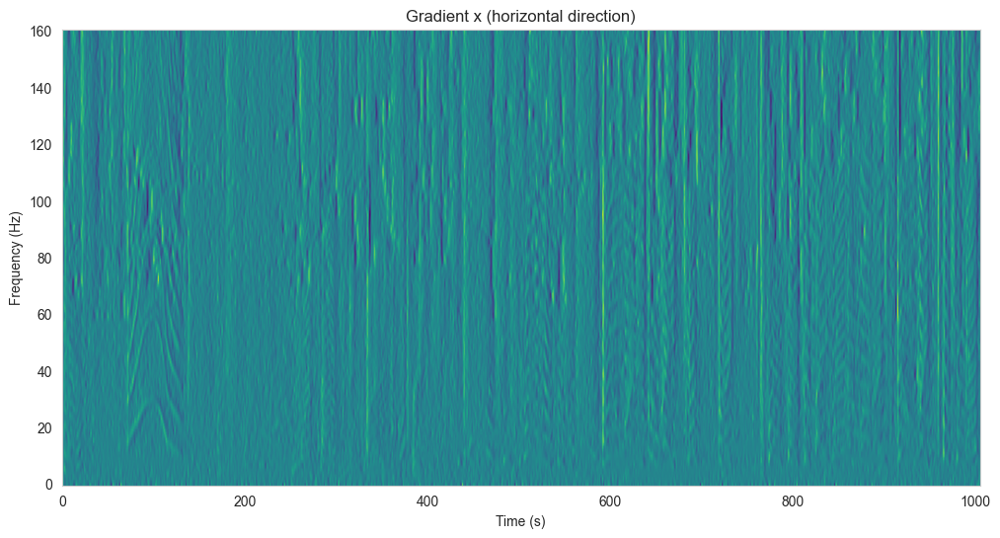

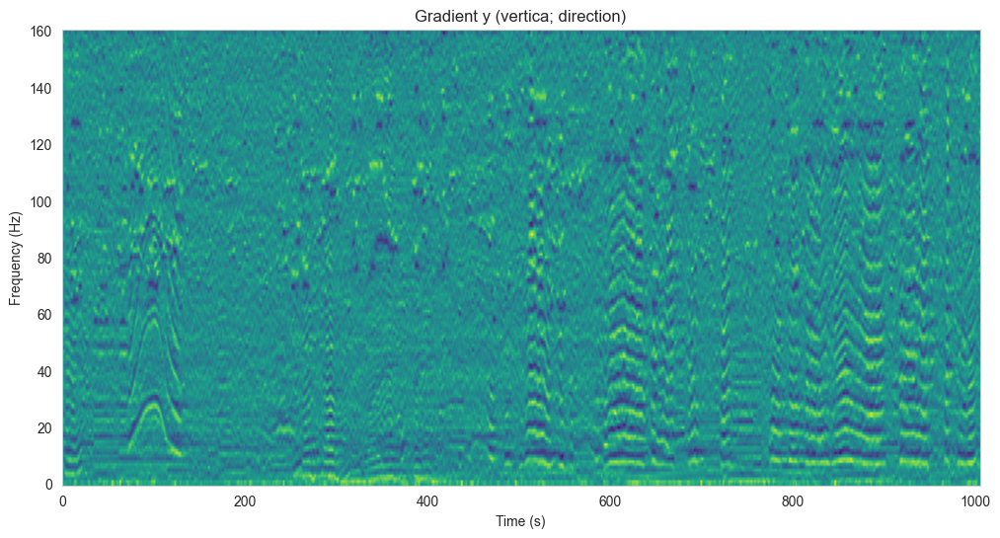

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


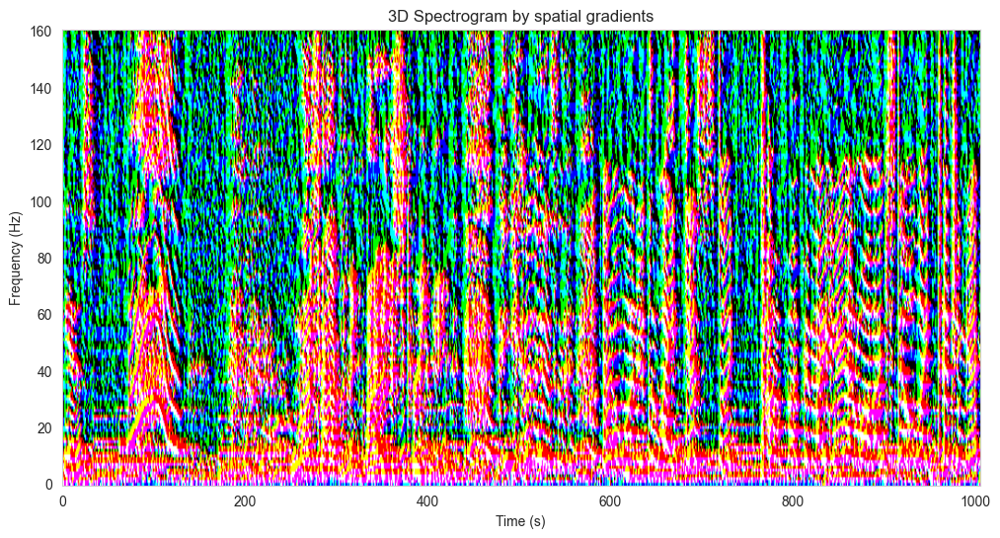

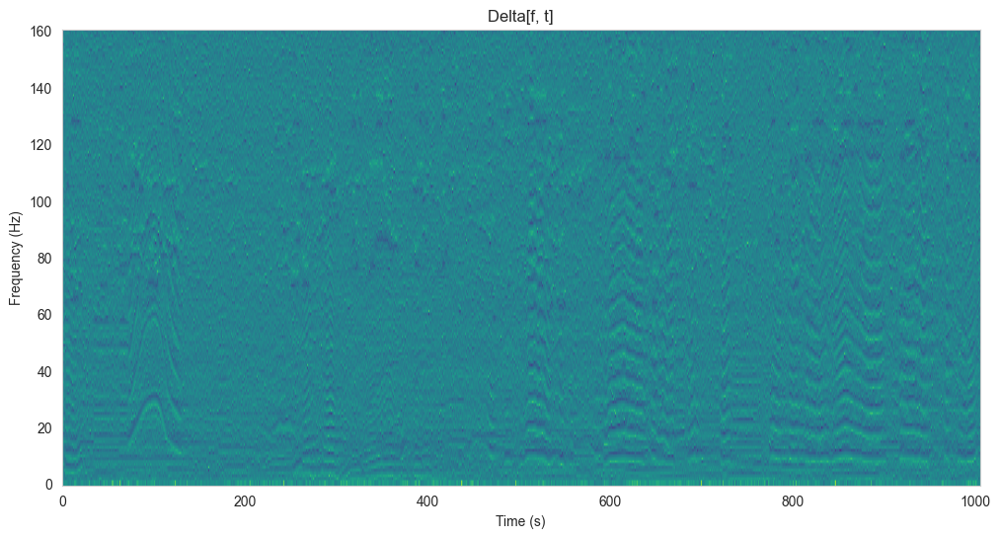

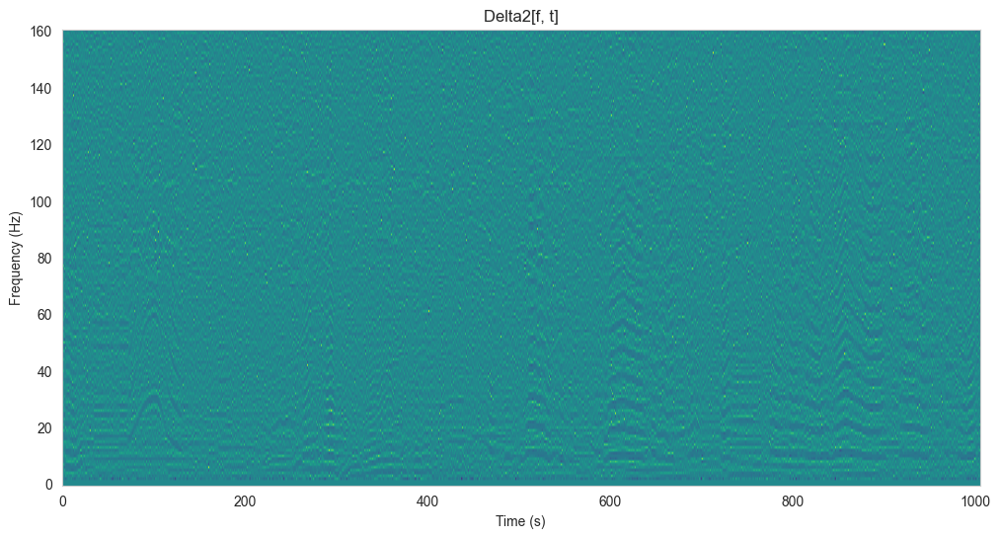

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


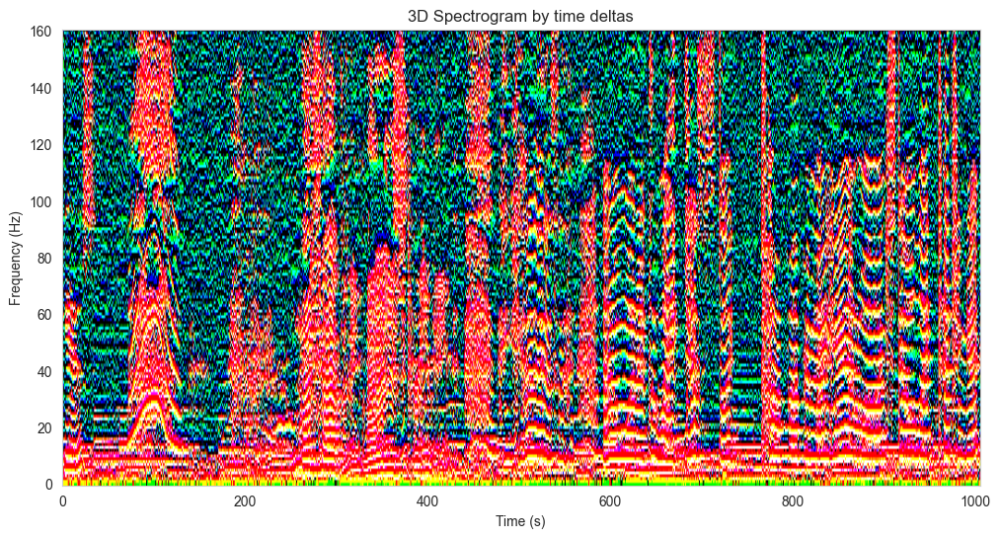

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


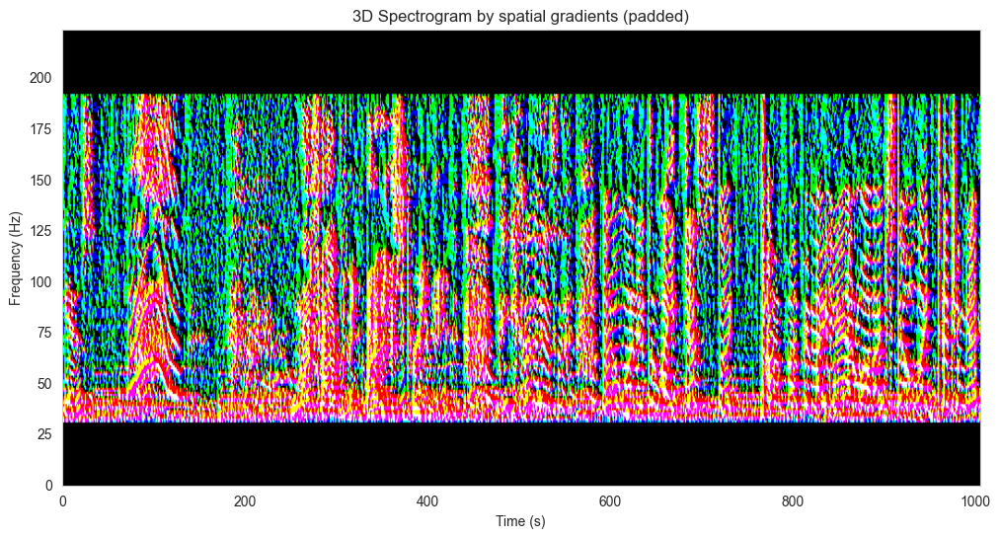

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


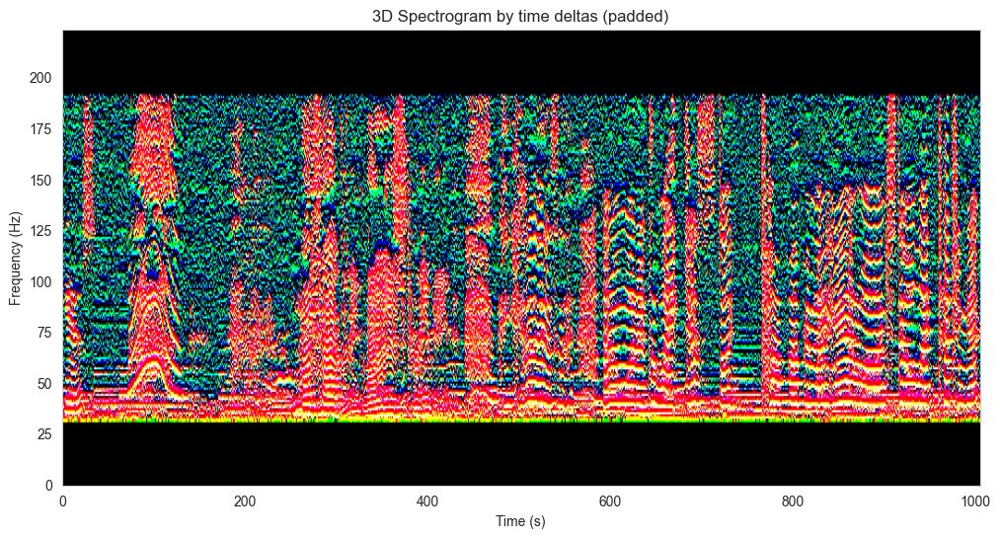

In [43]:
with open(os.path.join(os.path.dirname(os.getcwd()), 'data_path_config.json'), 'r') as file:
    config = json.load(file)

path_to_save_datasets = os.path.join(os.getcwd(), 'datasets')

if chan_gen_type == "sobel":
    specific_path = os.path.join(path_to_save_datasets,
                                 f"shuffle_3d_by_sobel_sliding_window")
elif chan_gen_type == "3d_spectrogram":
    specific_path = os.path.join(path_to_save_datasets,
                                 f"shuffle_3d_spectrogram_sliding_window")
else:
    raise NotImplementedError(f"There is no option as {chan_gen_type} for channels creation")

data_split_types = [os.path.basename(el).split('.')[0] for el in
                    glob.glob(os.path.join(config["datasets_videos"], "*.csv"))]

split_type = data_split_types[0]
dataset_name = f"{split_type}_dataset"

df = pd.read_csv(os.path.join(config["datasets_audio_216k"], f"{split_type}.csv"))
audio_file_path_list = df["file_path"].to_list()

train_dataset_data = []
for audio_idx, audio_file in enumerate(audio_file_path_list[5:7]):
    _label = np.array(df.iloc[audio_idx, 1:-1].values, dtype=int)
    if np.max(_label) != 0:
        _audio_wave = audio2wave(filepath=audio_file)
        visualize_wave(_audio_wave, '', "Audio wave")

        # Load the .wav file
        y, sr = librosa.load(audio_file, sr=None)

        # Compute the spectrogram
        D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)

        # Display the spectrogram
        plt.figure(figsize=(12, 6))
        librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
        plt.colorbar(format='%+2.0f dB')
        plt.title('Spectrogram')
        plt.xlabel('Time (s)')
        plt.ylabel('Frequency (Hz)')
        plt.tight_layout()
        plt.show()

        ###

        _audio_spectrogram, log_spectrogram = audio2spectrogram(filepath=audio_file)
        visualize_spectrogram(_audio_spectrogram, '', 'Spectrogram')
        visualize_spectrogram(log_spectrogram, '', 'Log normalized Spectrogram')

        _audio_spectrogram_3d_spatial = gradients_channels(log_spectrogram)
        visualize_emotion(_audio_spectrogram_3d_spatial.transpose(2, 0, 1), '', '3D Spectrogram by spatial gradients')

        _audio_spectrogram_3d_time_delta = get_3d_spectrogram(log_spectrogram)
        visualize_emotion(_audio_spectrogram_3d_time_delta.transpose(2, 0, 1), '', '3D Spectrogram by time deltas')

        _audio_spectrogram_3d_spatial_padded = pad_image_both(_audio_spectrogram_3d_spatial)
        visualize_emotion(_audio_spectrogram_3d_spatial_padded.transpose(2, 0, 1), '', '3D Spectrogram by spatial gradients (padded)')

        _audio_spectrogram_3d_time_delta_padded = pad_image_both(_audio_spectrogram_3d_time_delta)
        visualize_emotion(_audio_spectrogram_3d_time_delta_padded.transpose(2, 0, 1), '', '3D Spectrogram by time deltas (padded)')

        _audio_spectrogram_3d_spatial_patches = sliding_window_overlap(
            _audio_spectrogram_3d_spatial_padded,
            overlap=overlap_size
        )
        _audio_spectrogram_3d_time_delta_patches = sliding_window_overlap(
            _audio_spectrogram_3d_time_delta_padded,
            overlap=overlap_size
        )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


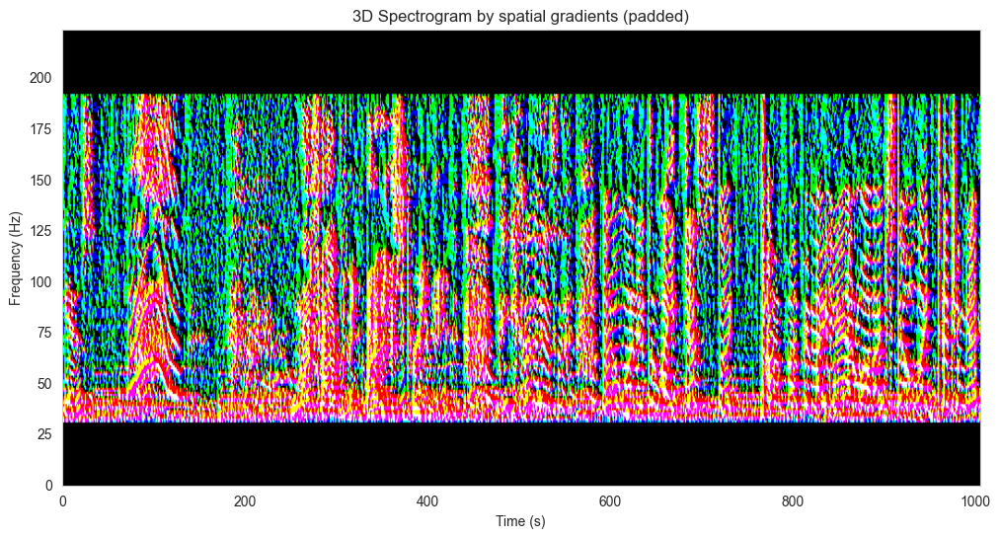

In [44]:
# _audio_spectrogram_3d_spatial_padded = pad_image_both(_audio_spectrogram_3d_spatial)
visualize_emotion(_audio_spectrogram_3d_spatial_padded.transpose(2, 0, 1), '', '3D Spectrogram by spatial gradients (padded)')

# _audio_spectrogram_3d_time_delta_padded = pad_image_both(_audio_spectrogram_3d_time_delta)
# visualize_emotion(_audio_spectrogram_3d_time_delta_padded.transpose(2, 0, 1), '', '3D Spectrogram by time deltas (padded)')
#
# _audio_spectrogram_3d_spatial_patches = sliding_window_overlap(
#     _audio_spectrogram_3d_spatial_padded,
#     overlap=overlap_size
# )
# _audio_spectrogram_3d_time_delta_patches = sliding_window_overlap(
#     _audio_spectrogram_3d_time_delta_padded,
#     overlap=overlap_size
# )

In [54]:
def visualize_emotion_ex(spectrogram, emotion_name, spec_name, _divider=1):
    fig = plt.figure(figsize=(int(8/_divider), 6))

    plt.grid(False)
    plt.imshow(spectrogram.T[:, :, :], aspect='auto', origin='lower', cmap="viridis")

    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.title(f"{spec_name}")
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


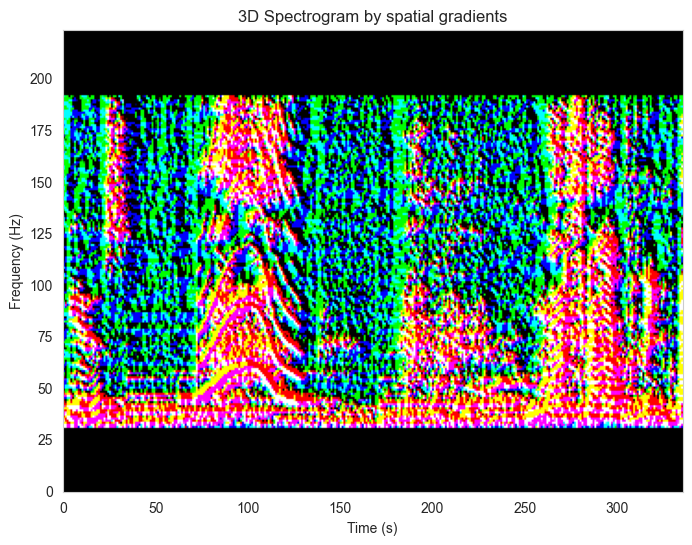

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


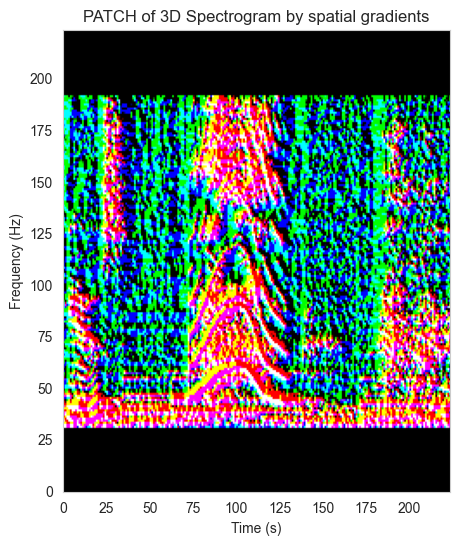

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


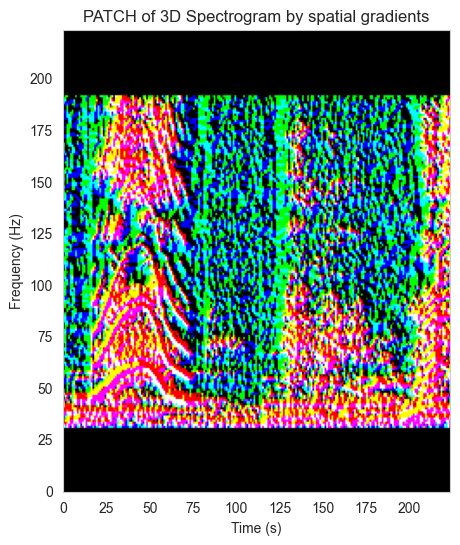

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


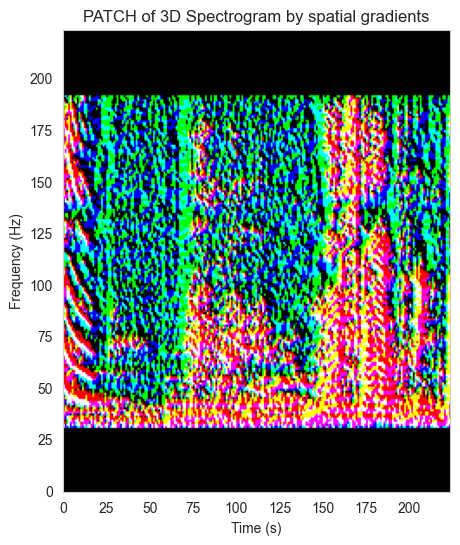

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


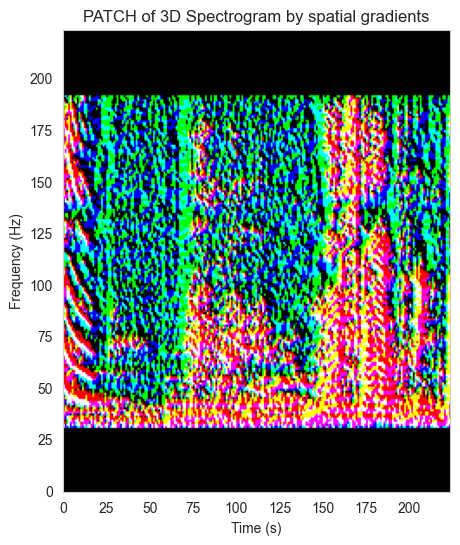

In [56]:
_audio_spectrogram_3d_spatial_padded_for_slide = _audio_spectrogram_3d_spatial_padded[:336, :, :]
visualize_emotion_ex(_audio_spectrogram_3d_spatial_padded_for_slide.transpose(2, 0, 1), '', '3D Spectrogram by spatial gradients')

_audio_spectrogram_3d_time_delta_patches_example = sliding_window_overlap(
    _audio_spectrogram_3d_spatial_padded_for_slide,
    overlap=overlap_size
)

for el in _audio_spectrogram_3d_time_delta_patches_example:
    visualize_emotion_ex(el.transpose(2, 0, 1), '', 'PATCH of 3D Spectrogram by spatial gradients', 336/224)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


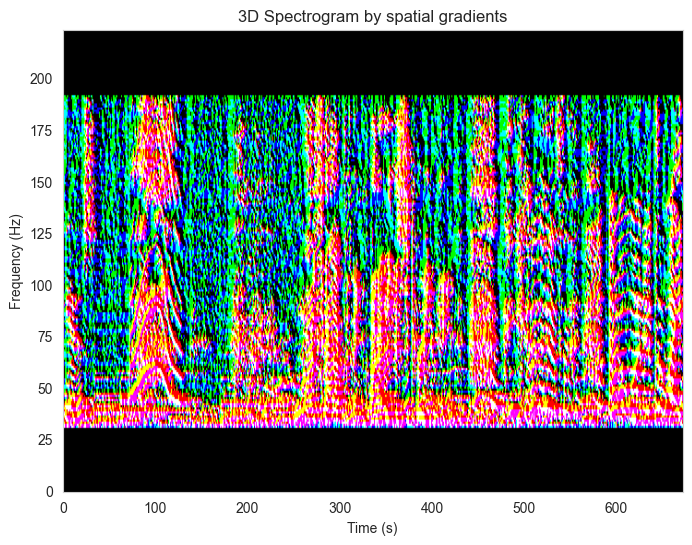

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


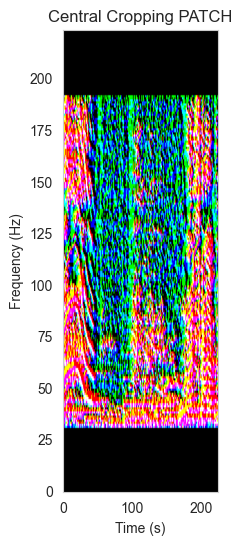

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


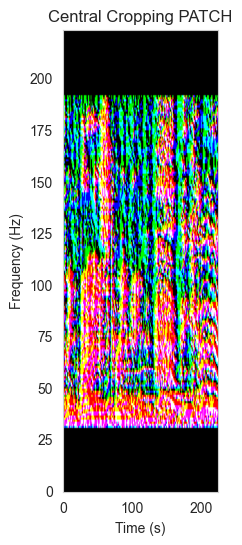

In [73]:
_audio_spectrogram_3d_spatial_padded_for_slide = _audio_spectrogram_3d_spatial_padded[:int(224*3), :, :]
visualize_emotion_ex(_audio_spectrogram_3d_spatial_padded_for_slide.transpose(2, 0, 1), '', '3D Spectrogram by spatial gradients')

_audio_spectrogram_3d_time_delta_patches_example = extract_central_parts(
    _audio_spectrogram_3d_spatial_padded_for_slide,
    overlap=overlap_size
)

for el in _audio_spectrogram_3d_time_delta_patches_example:
    visualize_emotion_ex(el.transpose(2, 0, 1), '', 'Central Cropping PATCH', _audio_spectrogram_3d_spatial_padded_for_slide.shape[0]/224)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


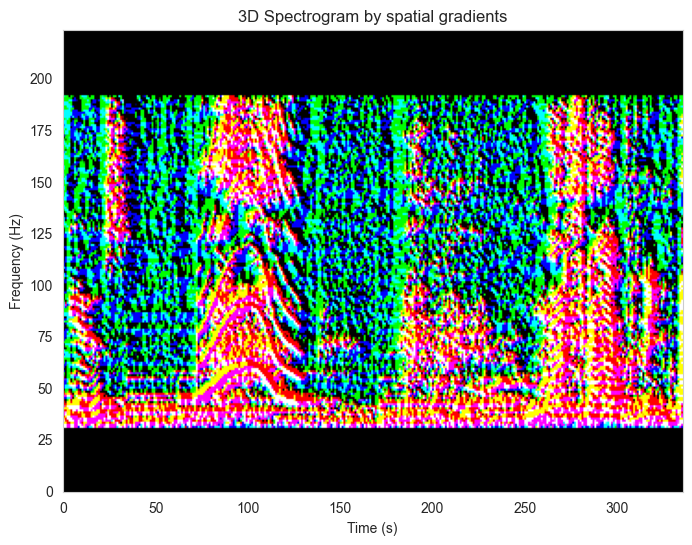

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


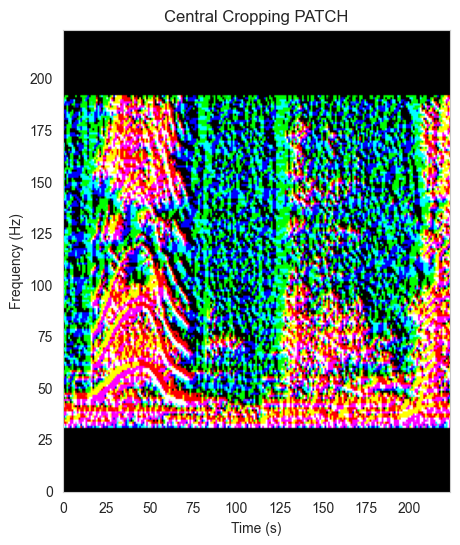

In [74]:
_audio_spectrogram_3d_spatial_padded_for_slide = _audio_spectrogram_3d_spatial_padded[:int(224*1.5), :, :]
visualize_emotion_ex(_audio_spectrogram_3d_spatial_padded_for_slide.transpose(2, 0, 1), '', '3D Spectrogram by spatial gradients')

_audio_spectrogram_3d_time_delta_patches_example = extract_central_parts(
    _audio_spectrogram_3d_spatial_padded_for_slide,
    overlap=overlap_size
)

for el in _audio_spectrogram_3d_time_delta_patches_example:
    visualize_emotion_ex(el.transpose(2, 0, 1), '', 'Central Cropping PATCH', _audio_spectrogram_3d_spatial_padded_for_slide.shape[0]/224)

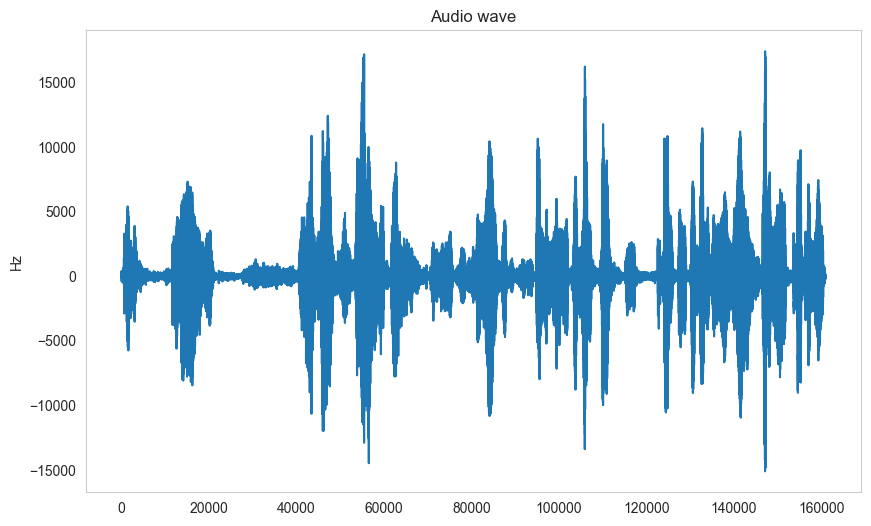

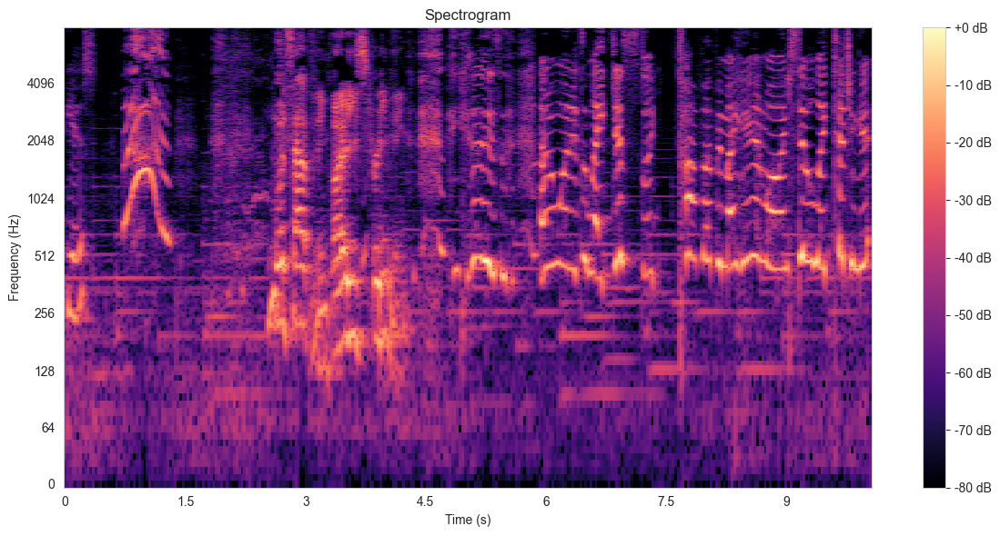

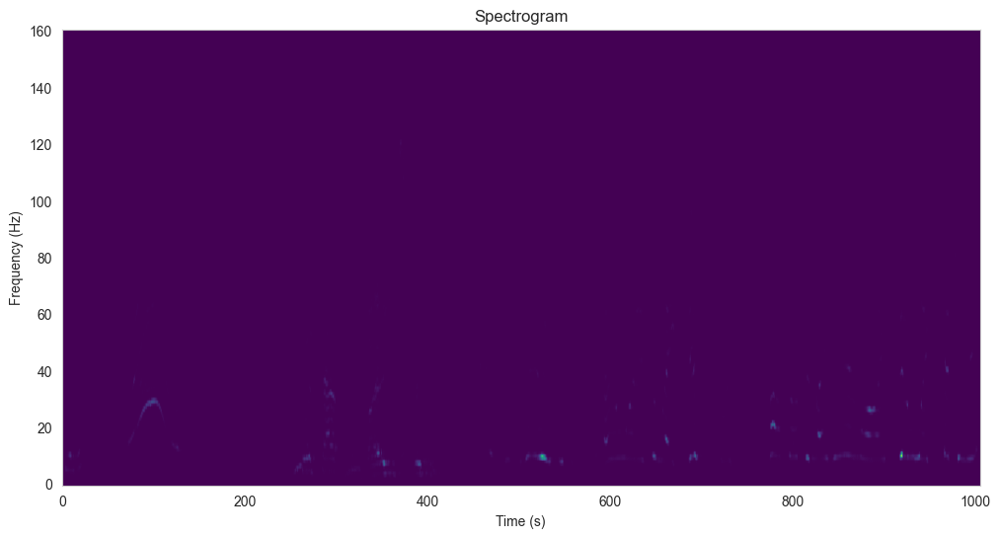

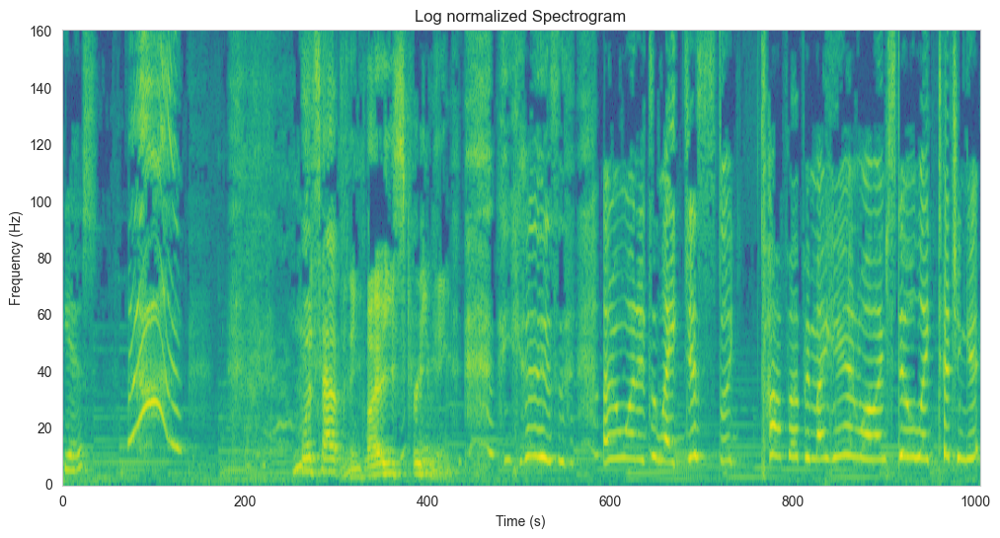

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


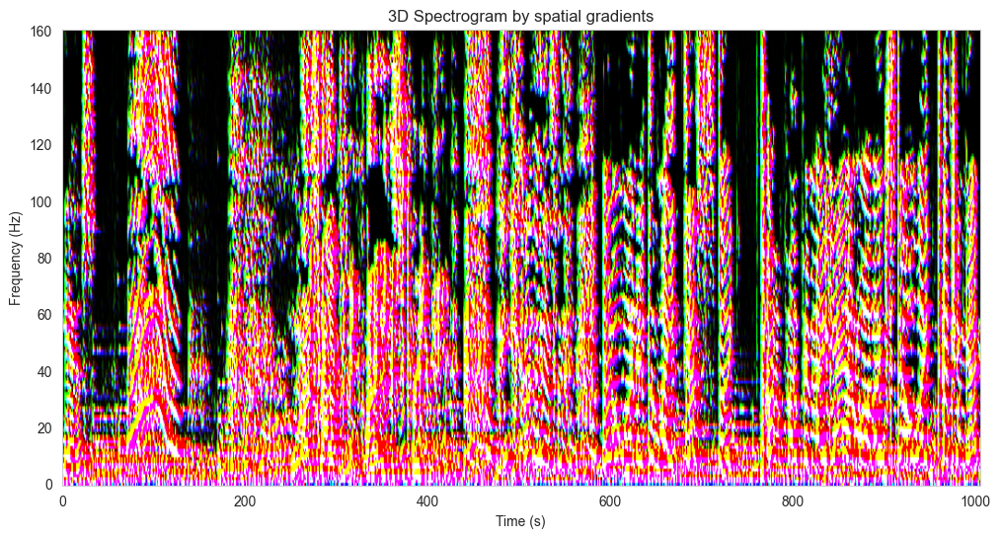

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


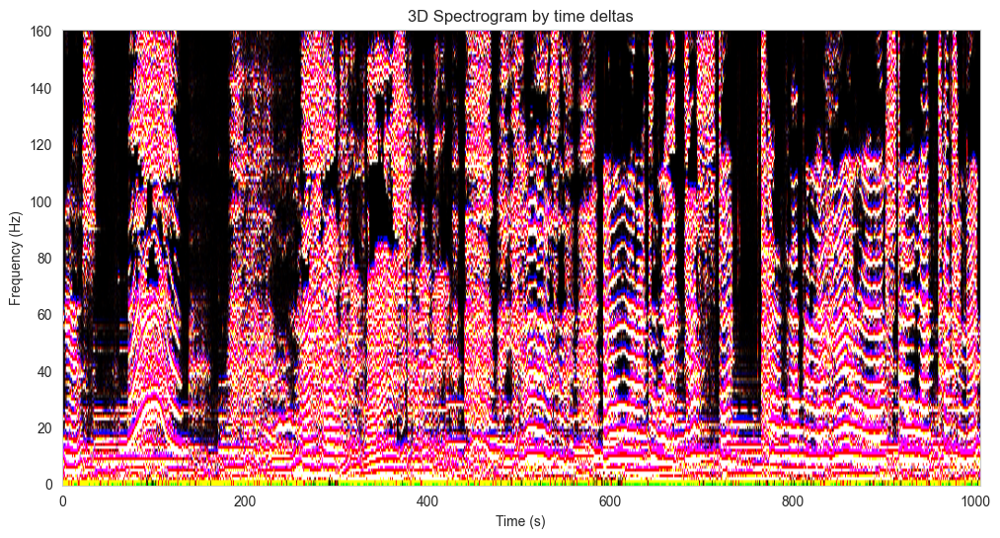

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


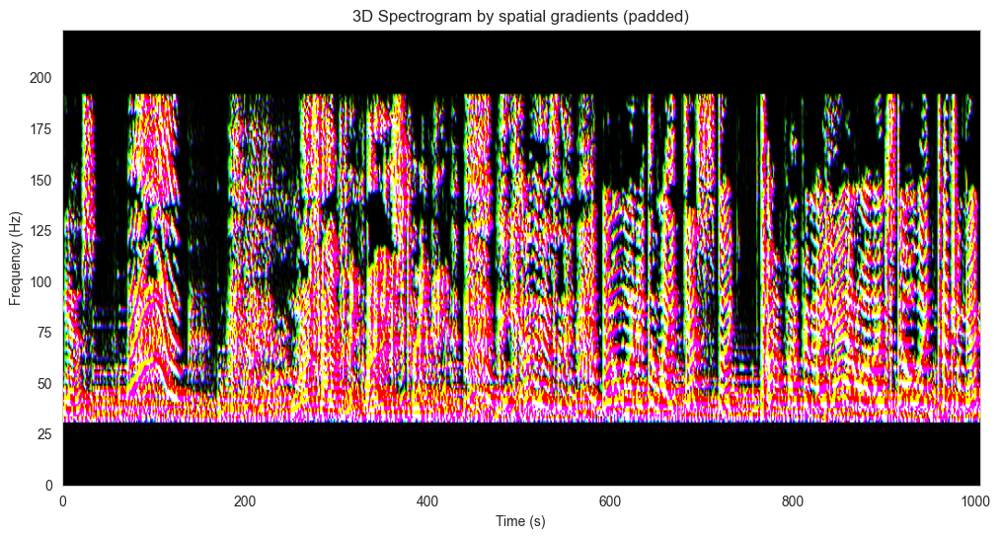

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


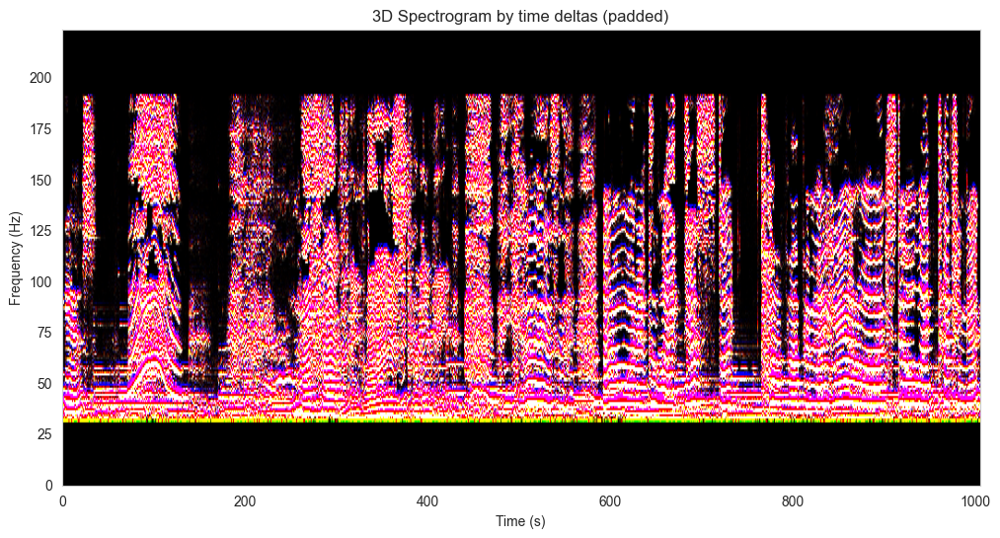

In [36]:
with open(os.path.join(os.path.dirname(os.getcwd()), 'data_path_config.json'), 'r') as file:
    config = json.load(file)

path_to_save_datasets = os.path.join(os.getcwd(), 'datasets')

if chan_gen_type == "sobel":
    specific_path = os.path.join(path_to_save_datasets,
                                 f"shuffle_3d_by_sobel_sliding_window")
elif chan_gen_type == "3d_spectrogram":
    specific_path = os.path.join(path_to_save_datasets,
                                 f"shuffle_3d_spectrogram_sliding_window")
else:
    raise NotImplementedError(f"There is no option as {chan_gen_type} for channels creation")

data_split_types = [os.path.basename(el).split('.')[0] for el in
                    glob.glob(os.path.join(config["datasets_videos"], "*.csv"))]

split_type = data_split_types[0]
dataset_name = f"{split_type}_dataset"

df = pd.read_csv(os.path.join(config["datasets_audio_216k"], f"{split_type}.csv"))
audio_file_path_list = df["file_path"].to_list()

train_dataset_data = []
for audio_idx, audio_file in enumerate(audio_file_path_list[5:7]):
    _label = np.array(df.iloc[audio_idx, 1:-1].values, dtype=int)
    if np.max(_label) != 0:
        _audio_wave = audio2wave(filepath=audio_file)
        visualize_wave(_audio_wave, '', "Audio wave")

        # Load the .wav file
        y, sr = librosa.load(audio_file, sr=None)

        # Compute the spectrogram
        D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)

        # Display the spectrogram
        plt.figure(figsize=(12, 6))
        librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
        plt.colorbar(format='%+2.0f dB')
        plt.title('Spectrogram')
        plt.xlabel('Time (s)')
        plt.ylabel('Frequency (Hz)')
        plt.tight_layout()
        plt.show()

        ###

        _audio_spectrogram, log_spectrogram = audio2spectrogram(filepath=audio_file)
        visualize_spectrogram(_audio_spectrogram, '', 'Spectrogram')
        visualize_spectrogram(log_spectrogram, '', 'Log normalized Spectrogram')

        _audio_spectrogram_3d_spatial = gradients_channels(_audio_spectrogram)
        visualize_emotion(_audio_spectrogram_3d_spatial.transpose(2, 0, 1), '', '3D Spectrogram by spatial gradients')

        _audio_spectrogram_3d_time_delta = get_3d_spectrogram(_audio_spectrogram)
        visualize_emotion(_audio_spectrogram_3d_time_delta.transpose(2, 0, 1), '', '3D Spectrogram by time deltas')

        _audio_spectrogram_3d_spatial_padded = pad_image_both(_audio_spectrogram_3d_spatial)
        visualize_emotion(_audio_spectrogram_3d_spatial_padded.transpose(2, 0, 1), '', '3D Spectrogram by spatial gradients (padded)')

        _audio_spectrogram_3d_time_delta_padded = pad_image_both(_audio_spectrogram_3d_time_delta)
        visualize_emotion(_audio_spectrogram_3d_time_delta_padded.transpose(2, 0, 1), '', '3D Spectrogram by time deltas (padded)')

        _audio_spectrogram_3d_spatial_patches = sliding_window_overlap(
            _audio_spectrogram_3d_spatial_padded,
            overlap=overlap_size
        )
        _audio_spectrogram_3d_time_delta_patches = sliding_window_overlap(
            _audio_spectrogram_3d_time_delta_padded,
            overlap=overlap_size
        )